<a href="https://colab.research.google.com/github/shubhu1026/AI-ML/blob/main/Image_Proc_Assign_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.8/974.8 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 60.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

### Importing Dataset Zip file and unzipping

In [ ]:
import zipfile

zip_file_path = '/content/drive/MyDrive/AI Capstone/Tco.zip'
unzip_dir = '/content/TACO/'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(unzip_dir)

print("Files unzipped successfully!")

Files unzipped successfully!


### Augmentation

In [ ]:
import cv2
import os
import random
import albumentations as A
from pathlib import Path

# Define the augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.RandomGamma(p=0.2),
    A.RandomScale(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.5),
    A.Resize(640, 640),
    A.RandomCrop(width=640, height=640, p=0.5),
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=20, p=0.2),
    A.Perspective(p=0.3),
    A.MotionBlur(p=0.2),
    A.GaussNoise(p=0.2),
    A.CLAHE(p=0.1, clip_limit=(1, 4)),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.3),
    A.Affine(scale=(0.8, 1.2), translate_percent=(0.1, 0.2), p=0.4),
], bbox_params=A.BboxParams(format='yolo', label_fields=['category_ids']))


image_dir = Path("/content/TACO/train/images")
label_dir = Path("/content/TACO/train/labels")
output_image_dir = image_dir
output_label_dir = label_dir
output_image_dir.mkdir(exist_ok=True)
output_label_dir.mkdir(exist_ok=True)

<ipython-input-14-341330f985c7>:17: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=1, sigma=50, alpha_affine=20, p=0.2),


In [ ]:
# Read YOLO label
def read_label(label_path):
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file.readlines()]
    return labels

# Write YOLO label
def write_label(label_path, labels):
    with open(label_path, 'w') as file:
        for label in labels:
            file.write(" ".join(label) + '\n')

In [ ]:
# Augment image using YOLO format
def augment_image(image_path, label_path, output_image_dir, output_label_dir, version_idx):
    image = cv2.imread(str(image_path))
    img_height, img_width = image.shape[:2]

    labels = read_label(label_path)

    # Convert to float and normalize if needed
    bboxes = []
    category_ids = []
    for label in labels:
        class_id, x_center, y_center, width, height = map(float, label)
        bboxes.append([x_center, y_center, width, height])
        category_ids.append(int(class_id))

    # Apply augmentations
    augmented = transform(image=image, bboxes=bboxes, category_ids=category_ids)

    augmented_image = augmented['image']
    augmented_bboxes = augmented['bboxes']
    augmented_labels = [
        [str(category_ids[i])] + [str(round(x, 6)) for x in augmented_bboxes[i]]
        for i in range(len(augmented_bboxes))
    ]

    # Save image and label
    out_image_name = f"augmented_{version_idx}_{image_path.stem}{image_path.suffix}"
    out_label_name = f"augmented_{version_idx}_{label_path.stem}{label_path.suffix}"

    cv2.imwrite(str(output_image_dir / out_image_name), augmented_image)
    write_label(output_label_dir / out_label_name, augmented_labels)

In [ ]:
# Process all images
for image_file in image_dir.glob("*.jpg"):
    label_file = label_dir / (image_file.stem + ".txt")
    if label_file.exists():
        for i in range(1):
            augment_image(image_file, label_file, output_image_dir, output_label_dir, i)
    else:
        print(f"Label file not found for {image_file}")

    print("Image Augmentation Done!")

Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!
Image Augmentation Done!


In [ ]:
taco_images_path = "/content/TACO/train/images"

image_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".tiff"}

num_images = sum(1 for file in os.listdir(taco_images_path) if file.lower().endswith(tuple(image_extensions)))

print(f"Number of TACO images after augmentation: {num_images}")

Number of TACO images after augmentation: 8400


In [ ]:
num_of_labels_after_aug = len(os.listdir("/content/TACO/train/labels"))

print(f"Total no. of labels after augmentation: {num_of_labels_after_aug}")

Total no. of labels after augmentation: 8400


In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_sample_bboxes_TACO(image_dir, label_dir, num_samples=5):
    # Get list of label files
    label_files = [f for f in os.listdir(label_dir) if f.endswith(".txt")]

    # Randomly select a few label files
    selected_labels = random.sample(label_files, min(num_samples, len(label_files)))

    for label_file in selected_labels:
        label_path = os.path.join(label_dir, label_file)
        image_path = os.path.join(image_dir, label_file.replace(".txt", ".jpg"))  # Assuming images are .jpg

        # Skip if image does not exist
        if not os.path.exists(image_path):
            print(f"Skipping {label_file}: Image not found")
            continue

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

        # Read bounding boxes
        with open(label_path, "r") as file:
            lines = file.readlines()

        h, w, _ = image.shape  # Get image dimensions

        # Plot image
        fig, ax = plt.subplots(1, figsize=(8, 6))
        ax.imshow(image)

        for line in lines:
            parts = line.strip().split()
            class_id = int(float(parts[0]))  # Convert from float string to int
            x_center, y_center, bbox_width, bbox_height = map(float, parts[1:])

            # Convert YOLO format to pixel values
            x_min = int((x_center - bbox_width / 2) * w)
            y_min = int((y_center - bbox_height / 2) * h)
            bbox_width = int(bbox_width * w)
            bbox_height = int(bbox_height * h)

            # Draw bounding box
            rect = patches.Rectangle(
                (x_min, y_min), bbox_width, bbox_height,
                linewidth=2, edgecolor='red', facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(x_min, y_min - 5, f"Class {class_id}", color='red', fontsize=10, backgroundcolor='white')

        # Show the image with bounding boxes
        plt.axis("off")
        plt.show()

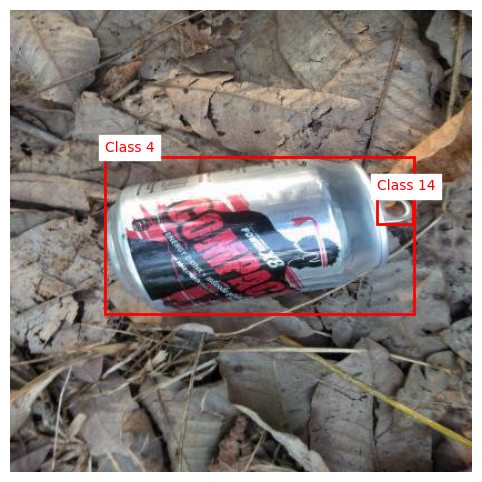

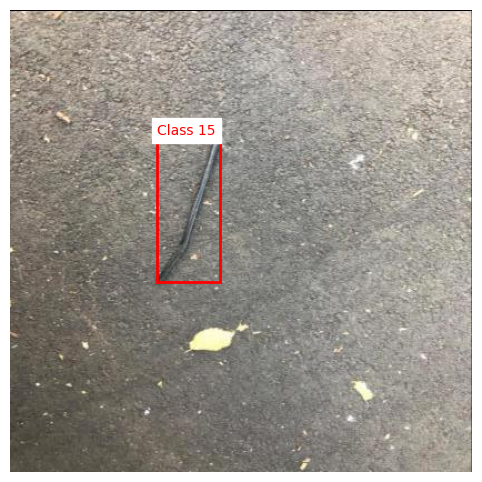

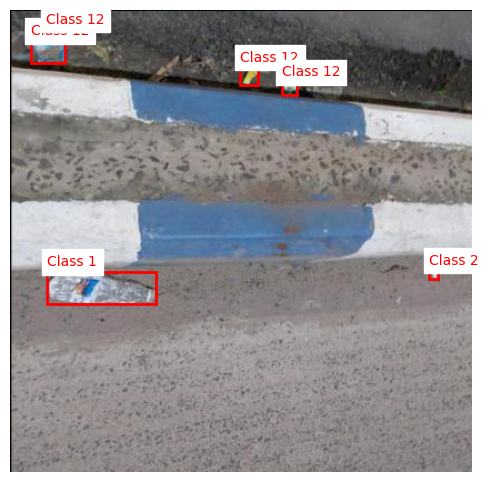

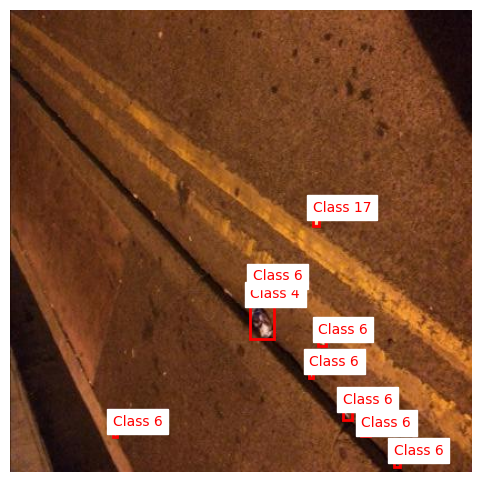

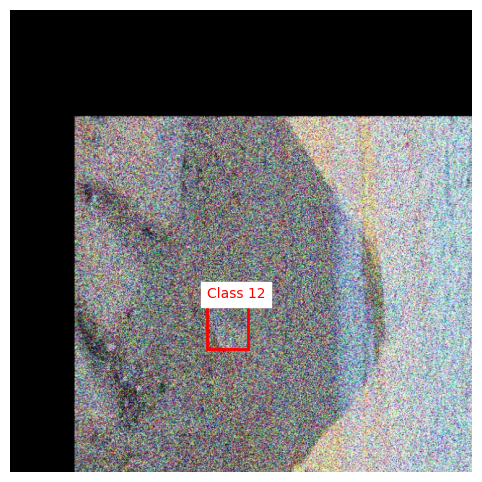

In [ ]:
taco_images_path = "/content/TACO/train/images"
taco_labels_path = "/content/TACO/train/labels"

plot_sample_bboxes_TACO(taco_images_path, taco_labels_path, num_samples=5)

### Loading and Training YOLO Model

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 255MB/s]


In [ ]:
results = model.train(
    data="/content/TACO/data.yaml",
    epochs=100,
    patience=3,
    imgsz=216,
    save=True,
)

Ultralytics 8.3.109 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/TACO/data.yaml, epochs=100, time=None, patience=3, batch=16, imgsz=216, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None

100%|██████████| 755k/755k [00:00<00:00, 113MB/s]


Overriding model.yaml nc=80 with nc=18

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/TACO/train/labels... 8400 images, 18 backgrounds, 0 corrupt: 100%|██████████| 8400/8400 [00:03<00:00, 2304.93it/s]


train: New cache created: /content/TACO/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/TACO/valid/labels... 1704 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1704/1704 [00:00<00:00, 1740.04it/s]


val: New cache created: /content/TACO/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100     0.432G      1.666      4.033      1.262         49        224: 100%|██████████| 525/525 [01:27<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:11<00:00,  4.90it/s]


                   all       1704       4830      0.161       0.12      0.033     0.0188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100     0.619G      1.768       3.08      1.304         57        224: 100%|██████████| 525/525 [01:21<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.74it/s]


                   all       1704       4830      0.233      0.133     0.0404     0.0207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100     0.633G      1.887      3.082      1.365         76        224: 100%|██████████| 525/525 [01:18<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:10<00:00,  5.25it/s]


                   all       1704       4830      0.211       0.11     0.0231     0.0114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100     0.645G      1.943      3.098        1.4         57        224: 100%|██████████| 525/525 [01:19<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.34it/s]


                   all       1704       4830      0.181      0.102     0.0328     0.0182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100     0.646G      1.891      2.998      1.385         52        224: 100%|██████████| 525/525 [01:19<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.48it/s]


                   all       1704       4830     0.0868       0.12      0.042      0.024

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100     0.662G      1.838      2.893      1.359         77        224: 100%|██████████| 525/525 [01:18<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.50it/s]


                   all       1704       4830      0.129      0.126     0.0411     0.0227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100     0.668G      1.803      2.822      1.343         45        224: 100%|██████████| 525/525 [01:19<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.41it/s]


                   all       1704       4830      0.164      0.133     0.0515     0.0299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      0.68G      1.765      2.773      1.335         51        224: 100%|██████████| 525/525 [01:19<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.53it/s]


                   all       1704       4830      0.216      0.123     0.0495     0.0289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100     0.688G      1.741      2.698       1.32         99        224: 100%|██████████| 525/525 [01:18<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.67it/s]


                   all       1704       4830      0.176      0.125     0.0564     0.0347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100     0.697G      1.746      2.699      1.324         49        224: 100%|██████████| 525/525 [01:19<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.97it/s]


                   all       1704       4830       0.23      0.119     0.0659     0.0408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100     0.705G       1.71      2.646      1.316         58        224: 100%|██████████| 525/525 [01:19<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.43it/s]


                   all       1704       4830      0.185      0.135     0.0684     0.0413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100     0.717G      1.701      2.618      1.314         65        224: 100%|██████████| 525/525 [01:19<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.36it/s]


                   all       1704       4830      0.214      0.147     0.0653      0.038

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100     0.725G      1.689      2.588      1.297         65        224: 100%|██████████| 525/525 [01:19<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.52it/s]


                   all       1704       4830      0.267      0.145     0.0716      0.044

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100     0.736G      1.678      2.552      1.288         51        224: 100%|██████████| 525/525 [01:17<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.47it/s]


                   all       1704       4830      0.254      0.147     0.0781     0.0499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100     0.744G      1.673      2.547      1.286         38        224: 100%|██████████| 525/525 [01:19<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.27it/s]


                   all       1704       4830      0.275      0.148     0.0816     0.0512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100     0.758G      1.654      2.513      1.279         54        224: 100%|██████████| 525/525 [01:19<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.46it/s]


                   all       1704       4830      0.293      0.135     0.0804     0.0498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100     0.764G      1.651        2.5      1.272         38        224: 100%|██████████| 525/525 [01:17<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.54it/s]


                   all       1704       4830      0.327      0.144      0.079     0.0493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100     0.775G       1.64      2.473      1.272         66        224: 100%|██████████| 525/525 [01:18<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.45it/s]


                   all       1704       4830      0.262      0.148     0.0879     0.0558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100     0.787G      1.626      2.454      1.266         41        224: 100%|██████████| 525/525 [01:18<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:08<00:00,  6.11it/s]


                   all       1704       4830      0.259      0.144     0.0798     0.0504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100     0.795G      1.619      2.423      1.264         52        224: 100%|██████████| 525/525 [01:17<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.54it/s]


                   all       1704       4830      0.217      0.165     0.0858     0.0544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100     0.805G      1.606      2.417      1.258         77        224: 100%|██████████| 525/525 [01:17<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.52it/s]


                   all       1704       4830      0.254      0.159     0.0861     0.0549
EarlyStopping: Training stopped early as no improvement observed in last 3 epochs. Best results observed at epoch 18, best model saved as best.pt.
To update EarlyStopping(patience=3) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

21 epochs completed in 0.522 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.109 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:10<00:00,  5.22it/s]


                   all       1704       4830      0.262      0.149     0.0879     0.0557
        Aluminium foil         48         62      0.331      0.145      0.175      0.113
            Bottle cap        347        459      0.165      0.368      0.173      0.111
                Bottle        275        320      0.271      0.209      0.175      0.116
          Broken glass         13        123          1          0     0.0135    0.00135
                   Can        187        267      0.208      0.315      0.151        0.1
                Carton        207        263     0.0767      0.274      0.093     0.0593
             Cigarette        223        565      0.381    0.00177    0.00777    0.00553
                   Cup        162        186      0.215      0.242      0.139     0.0831
                   Lid         82         93      0.311      0.226      0.188      0.118
          Other litter        148        178      0.159     0.0618     0.0647     0.0458
         Other plasti

In [ ]:
results = model.val()

Ultralytics 8.3.109 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/TACO/valid/labels.cache... 1704 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1704/1704 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 107/107 [00:10<00:00,  9.91it/s]


                   all       1704       4830      0.263      0.148     0.0878     0.0557
        Aluminium foil         48         62      0.343      0.145      0.175      0.116
            Bottle cap        347        459      0.165      0.368      0.173      0.112
                Bottle        275        320      0.271      0.209      0.176      0.116
          Broken glass         13        123          1          0     0.0135    0.00135
                   Can        187        267      0.208      0.315      0.151        0.1
                Carton        207        263     0.0757       0.27      0.093     0.0591
             Cigarette        223        565      0.381    0.00177    0.00788    0.00554
                   Cup        162        186      0.215      0.242      0.139     0.0826
                   Lid         82         93      0.311      0.226      0.189      0.118
          Other litter        148        178      0.159     0.0618     0.0649     0.0458
         Other plasti

['/content/runs/detect/train/F1_curve.png', '/content/runs/detect/train/PR_curve.png', '/content/runs/detect/train/P_curve.png', '/content/runs/detect/train/R_curve.png', '/content/runs/detect/train/confusion_matrix.png', '/content/runs/detect/train/confusion_matrix_normalized.png', '/content/runs/detect/train/labels.jpg', '/content/runs/detect/train/labels_correlogram.jpg', '/content/runs/detect/train/results.png', '/content/runs/detect/train/train_batch0.jpg', '/content/runs/detect/train/train_batch1.jpg', '/content/runs/detect/train/train_batch2.jpg', '/content/runs/detect/train/val_batch0_labels.jpg', '/content/runs/detect/train/val_batch0_pred.jpg', '/content/runs/detect/train/val_batch1_labels.jpg', '/content/runs/detect/train/val_batch1_pred.jpg', '/content/runs/detect/train/val_batch2_labels.jpg', '/content/runs/detect/train/val_batch2_pred.jpg']


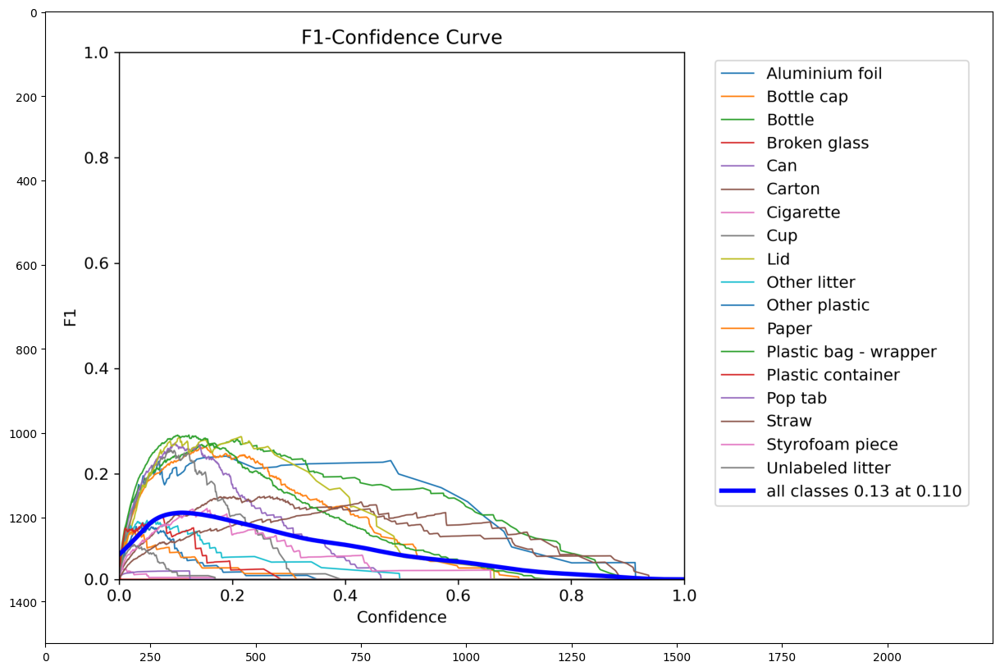

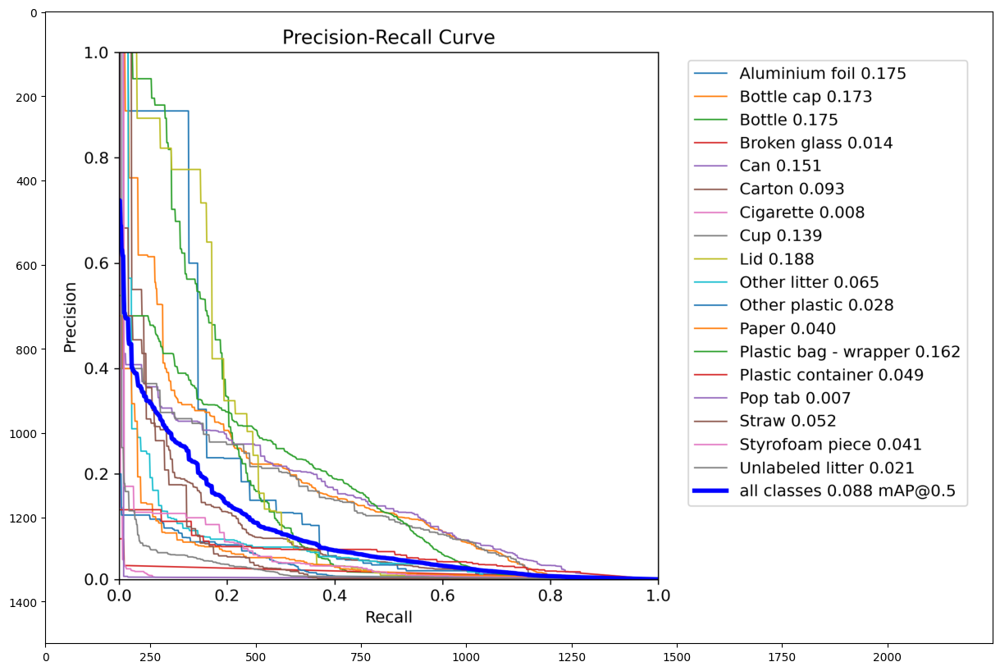

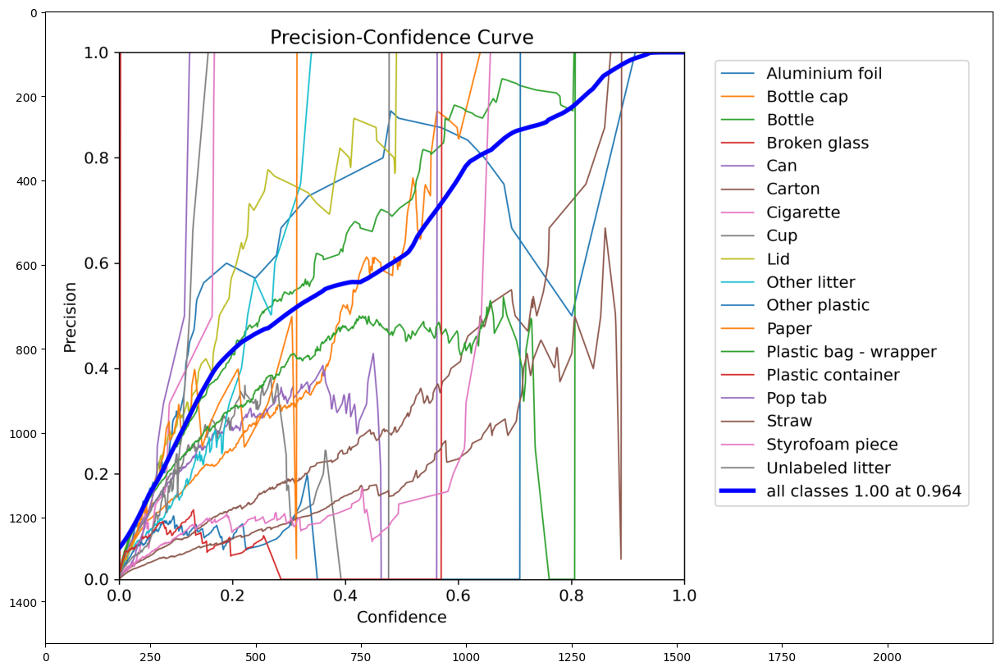

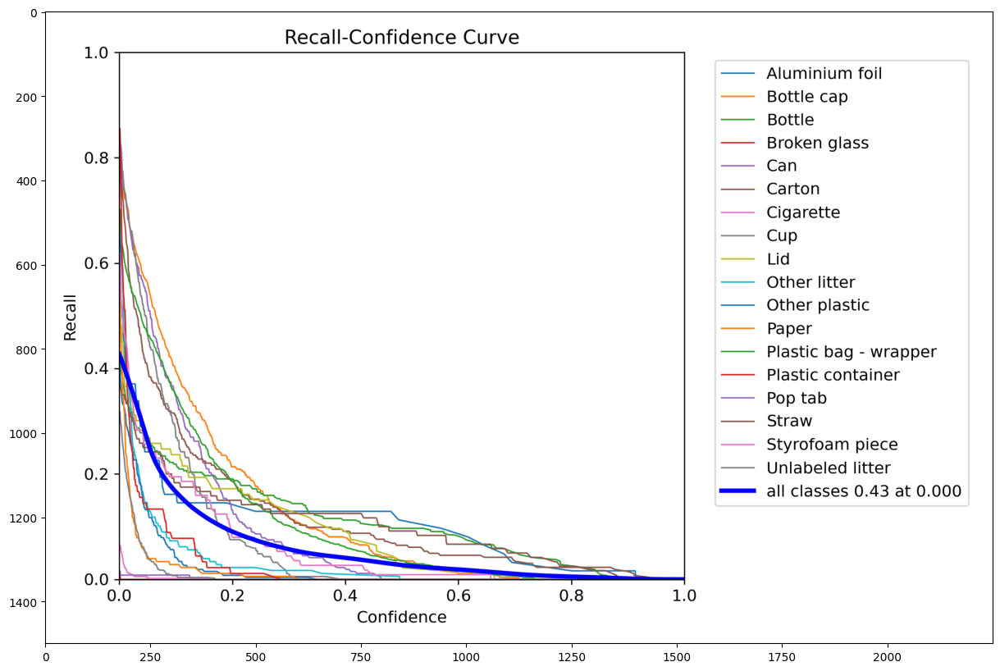

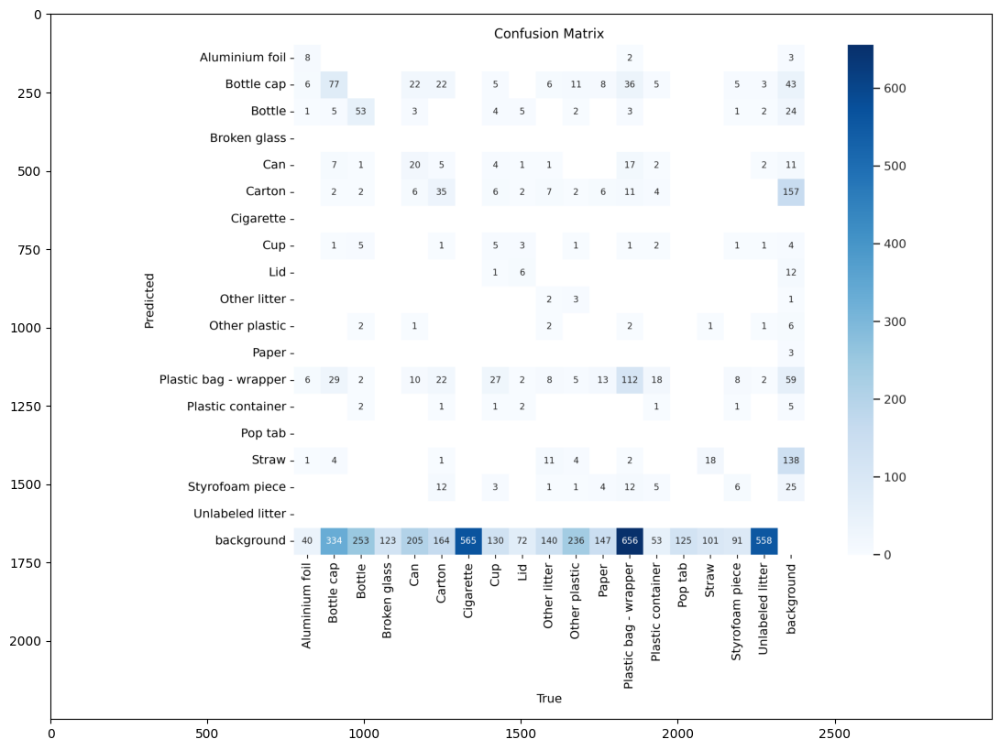

...

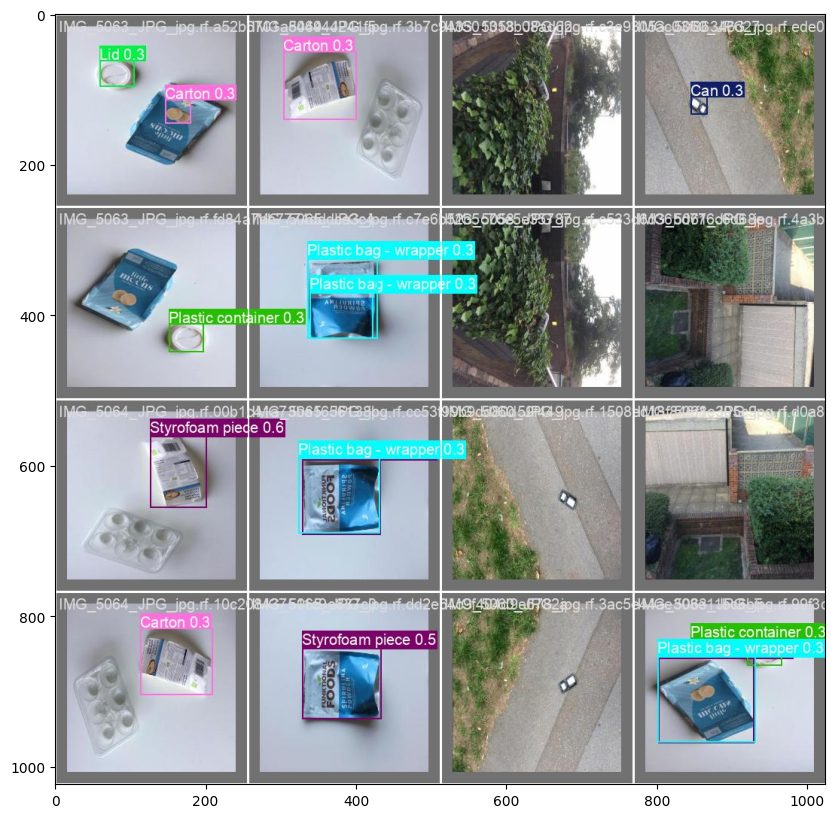

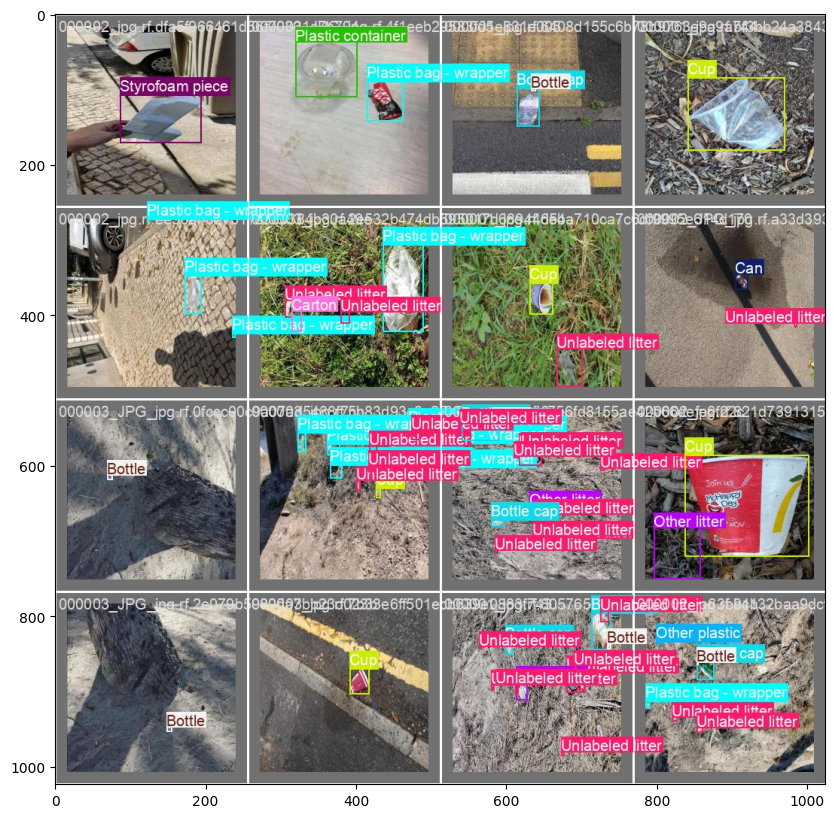

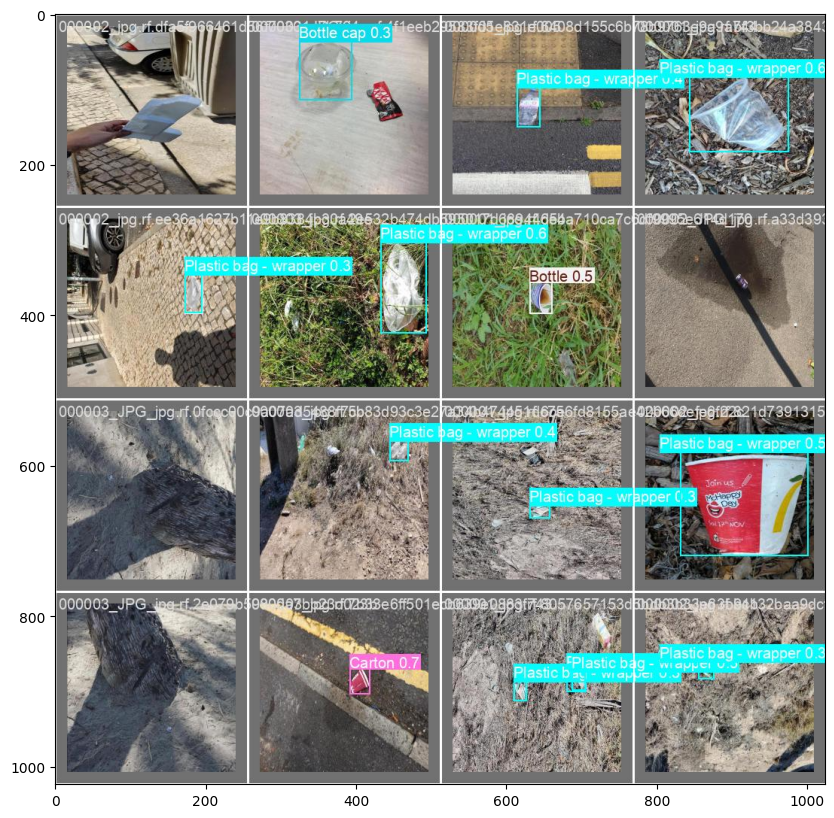

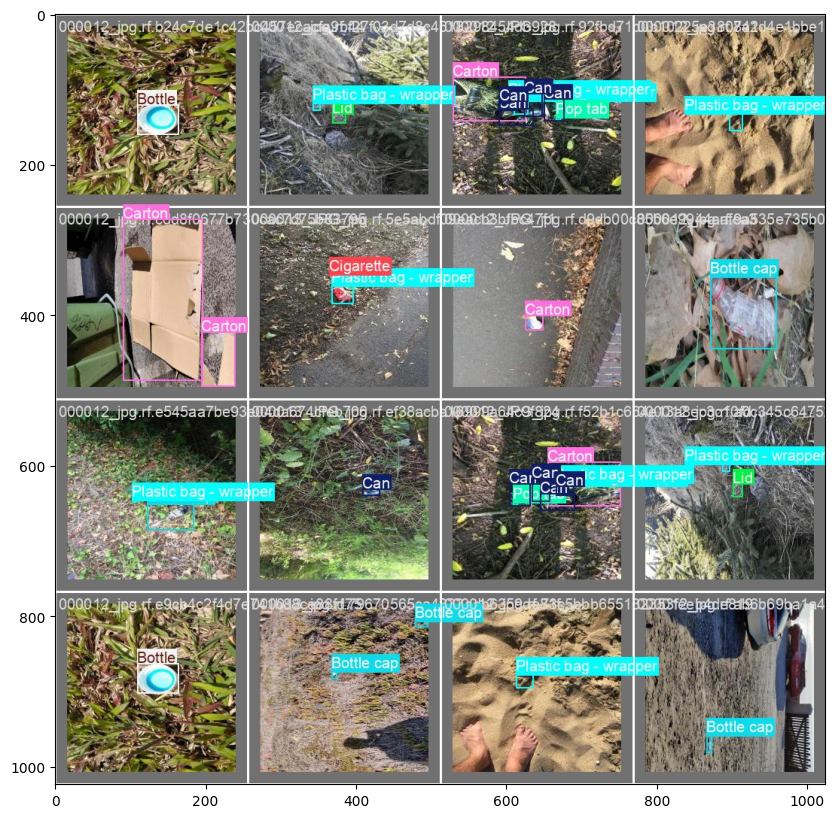

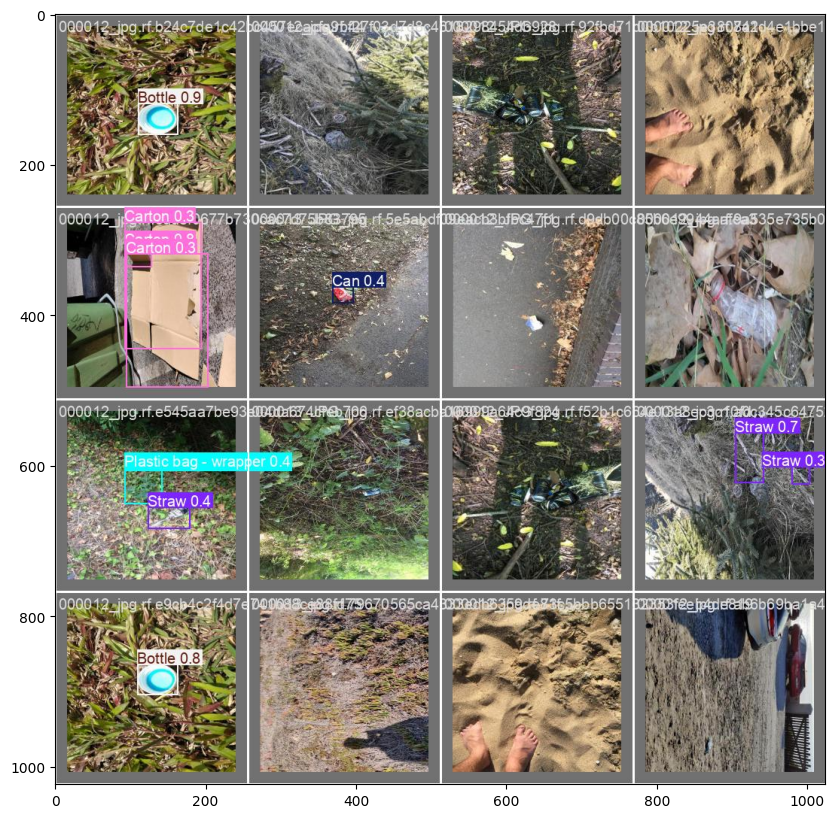

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

paths2=[]
for dirname, _, filenames in os.walk('/content/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.jpg' or filename[-4:]=='.png':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)

print(paths2)

for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()